# Introduction

This notebook is made to predict attrition using the IBM HR Employee attrition data set. 
The notebook is constructed as follows:
- [Introductory Data Analysis](#introductory-data-analysis)
- [Exploratory Data Analyais](#exploratory-data-analysis)
- [Predicting Attrition]

We start by running the libraries below and begin our journey to discover some insights from this dataset:

In [121]:
#Libraries
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, classification_report 
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler 
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix

%matplotlib inline

# Introductory Data Analysis

Let us begin by loading the data into this notebook:

In [82]:
file = '../Data/WA_Fn-UseC_-HR-Employee-Attrition.csv'

df=pd.read_csv(file)
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


Looking at the overview of the data, we can see that we have <font color='aqua'>35 </font> columns available in this dataset. 
We will pass the pandas profiling render the exploratory data analysis on each columns and give us a better overview:

In [11]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We can see in the overview section that we have <font color='aqua'> 1470 </font> observations with no missing data. The profiling has also given us the break down of the feature types in the dataset with <font color='aqua'> 15 </font> numeric features, <font color='aqua'> 3 </font>  boolean features and <font color='aqua'> 17 </font> categorical features

In the above report, we can drill down to the individual features and understand its distribution and breakdown in more detail that you can look through at your own time.

# Exploratory Data Analysis

As the above reports represents the data profiling of all the features independently, in this section we will explore how our target variable (Attrition) behaves against other features in the dataset.

## Exploring Boolean values against Attrition: Overtime, Over18
In our dataset, we have three boolean values, Attrition, Overtime and Over18. As Attrition is our target variable, we will look at whether Overtime has effect on attrition. Over18 will be excluded from the analysis as it is only confirming that all of our observations are over 18 years of age at time of employment, which all the observations results to True.

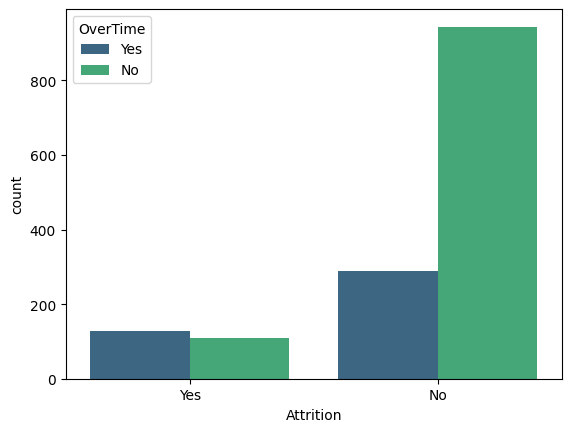

In [23]:
ax=sns.countplot(data=df,x='Attrition',hue='OverTime',palette='viridis')
plt.show('Attrition by OverTime')
for i in ax.containers:
    ax.bar_label(i,)

Looking at the above graph, we can see that those who left did do OverTime during their time, however, comparing it against the attrition who did not do Overtime, it is not such a big of a gap, indicating that Overtime alone may not be a factor for leaving the company in general.


## Exploring Categorical Variables against Attrition: Gender, Department, Job Role
We have 17 categorical variables we can visualise from, so we have selected gender, department and job role to investigate further.


### Attrition vs Gender
Let us look the number of male and female leaving the firm in the following graph below:

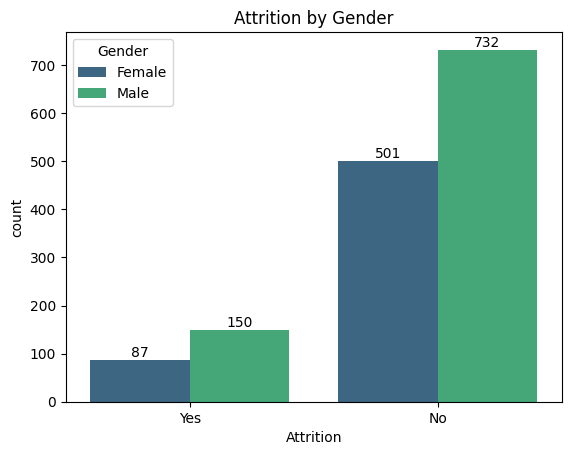

In [22]:
ax=sns.countplot(data=df,x='Attrition',hue='Gender',palette='viridis')
plt.title('Attrition by Gender')
for i in ax.containers:
    ax.bar_label(i,)

We can seee that those who left the company, most of them where male rather than female. 

### Attrition vs Department
Let us calculate the proporation of people left by department

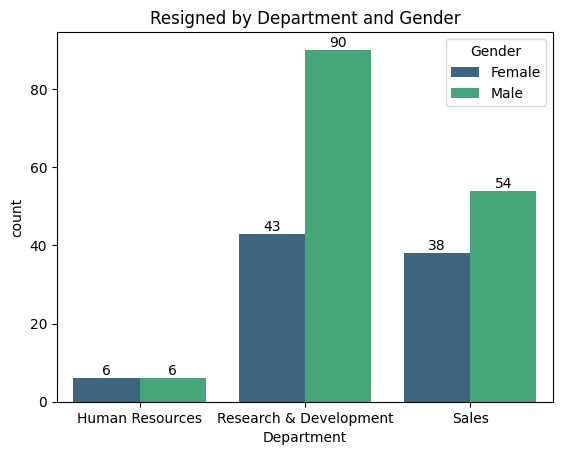

In [21]:
left=df.groupby(['Department','Gender'])['Attrition'].apply(lambda x: (x=='Yes').sum()).reset_index(name='count')
ax=sns.barplot(data=left,x='Department',y='count',hue='Gender',palette='viridis')
plt.title('Resigned by Department and Gender')
for i in ax.containers:
    ax.bar_label(i,)

We can see from the above barplot that most of the resigned male population comes from the Research and Development Department followed by the Sales department. Let us confirm which department has the highest resource count overall by investigating the number of employees regardless of attrition by department and sectioned by gender:

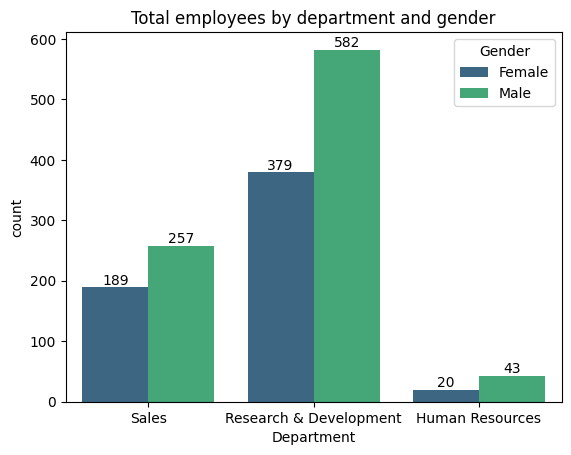

In [20]:
ax=sns.countplot(data=df,x='Department',hue='Gender',palette='viridis')
plt.title('Total employees by department and gender')
for i in ax.containers:
    ax.bar_label(i,)

 Research and Development Department has the largest count of employees with a total of <font color='aqua'>961 </font> employees. The next largest department is Sales with <font color='aqua'> 446 </font>employees. From the above graph, we can see that the employee turnover seem to be the highest among these two department given the size of these departments in general.

 ### Attrition vs Job Role
 Let us also take a look at the number of people left by job role

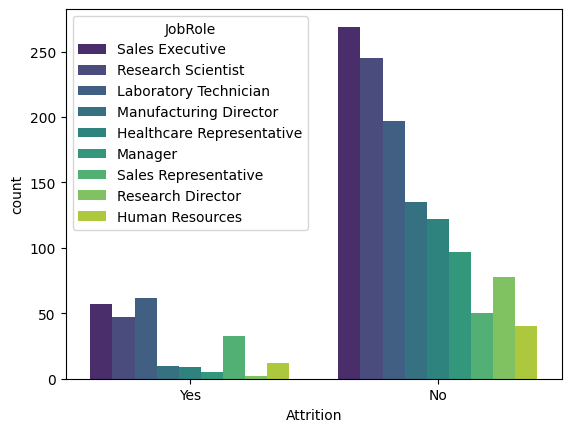

In [28]:
ax=sns.countplot(data=df,x='Attrition',hue='JobRole',palette='viridis')
plt.show('Attrition by Job Role')
for i in ax.containers:
    ax.bar_label(i,)

Looking at the above table, we can see that <font color='aqua'> Laboratory Technication </font> has the highest number of attrition, followed by <font color='aqua'> Sales Executive </font> and <font color='aqua'> Research Scientist </font>

## Attrition by Salary band

We also want to look at the attrition by Monthly Salary. With that, we want to focus on creating a salary band, since we are dealing with a numeric datatype. So I will create the salary band by looking at some descriptive statistical information.

In [36]:
df['MonthlyIncome'].describe()

count     1470.000000
mean      6502.931293
std       4707.956783
min       1009.000000
25%       2911.000000
50%       4919.000000
75%       8379.000000
max      19999.000000
Name: MonthlyIncome, dtype: float64

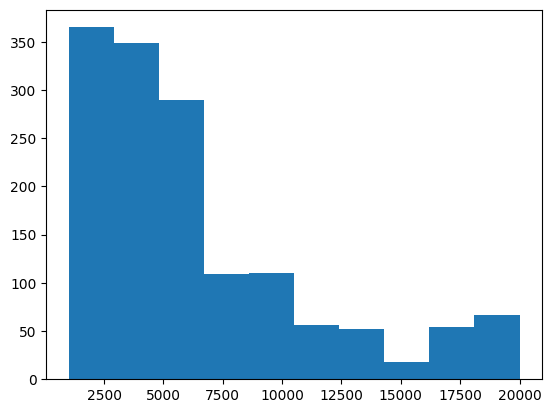

In [38]:
plt.hist(df['MonthlyIncome'])
plt.show()

From the above statistics, we can see quite that the mean salary is 6503 dollars, with minimum and maximum salary range from 1009 to 19999 dollars, respectively. When looking at the graph and comparing against the descriptive statistics above, we can see that 50% quantile is at 4919 dollars, and 75% quantile has the data at 8379 dollars. This basically means that our bins will be mostly concentrated around lower salary ranges than higher salary ranges. 

With this information, I will create the following buckets:
- 0 - 3500 dollars
- 3501 - 7000 dollars
- Over 7000 dollars



In [46]:
salary_bins=[]

for i in df['MonthlyIncome']:
    if i > 0 and i <=3500:
        salary_bins.append('0 - 3500 dollars')
    elif i >3500 and i <=7000:
        salary_bins.append('3501 - 7000 dollars')
    elif i >7000:
        salary_bins.append('Over 7000 dollars')

df['salary_bins']=salary_bins

Now with the above salary bins in our dataset, let us investigate attrition by salary ranges


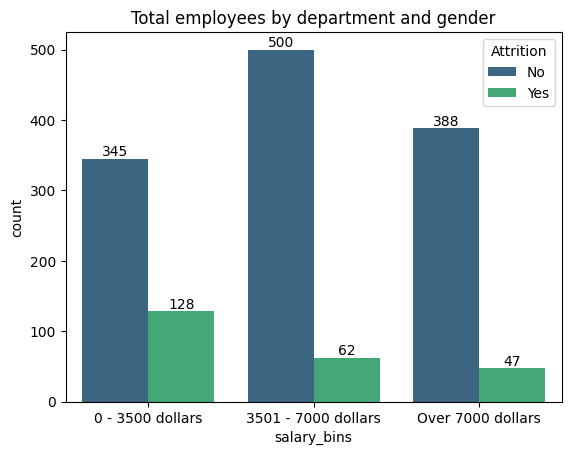

In [51]:
df= df.sort_values('salary_bins')
ax=sns.countplot(data=df,x='salary_bins',hue='Attrition',palette='viridis')
plt.title('Total employees by department and gender')
for i in ax.containers:
    ax.bar_label(i,)

We can see the majority of attrition is accounted to those in the lower salary bucket range of less than 3500 dollars.

# Correlation Analysis
Let us see examine relationship between the variables we have and whether they correlate against our target variable. 

In [52]:
#Lets drop the unwanted columns
df.drop(['Over18','EmployeeNumber','EmployeeCount'],axis=1, inplace=True)

/var/folders/81/kzg9lc7n4t15f722_x0fq6lw0000gn/T/ipykernel_6573/172236441.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<AxesSubplot: >

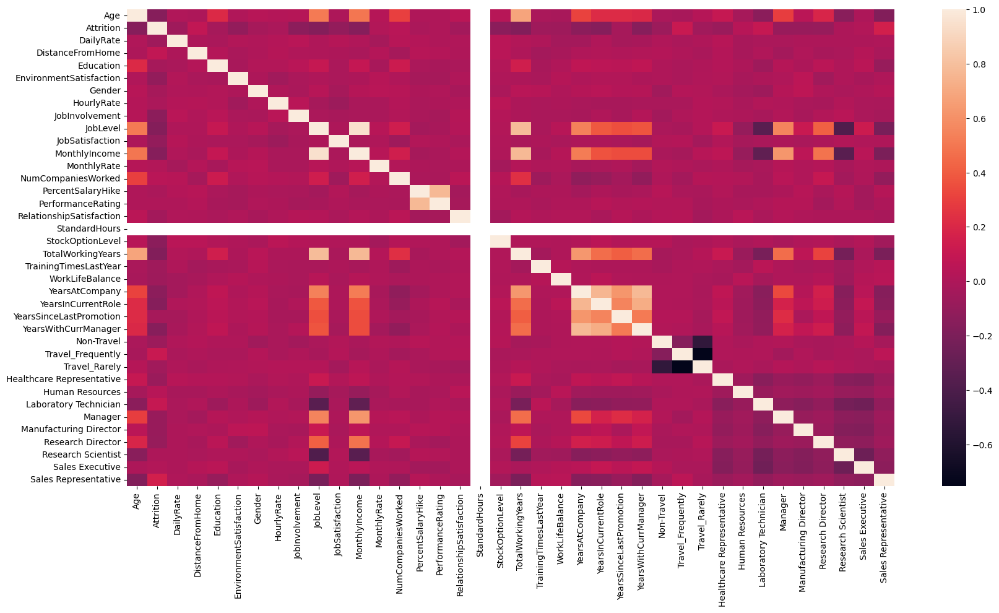

In [64]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr())

In [95]:
df['Attrition'] = df['Attrition'].map(dict(Yes=1, No=0))
df['Gender'] = df['Gender'].map(dict(Female=1, Male=0))
df=df.join(pd.get_dummies(df['BusinessTravel'],dtype=int))
df['MaritalStatus'] = df['MaritalStatus'].map(dict(Single=0, Married=1, Divorced=2))
df=df.join(pd.get_dummies(df['JobRole'],dtype=int))
df=df.join(pd.get_dummies(df['Department'],dtype=int))
df=df.join(pd.get_dummies(df['EducationField'],dtype=int))
df['OverTime'] = df['OverTime'].map(dict(Yes=1, No=0))

#df.rename(columns={'Human Resources':'Human Resource Education'}, inplace=True)

In [98]:
df.drop(['Department','EducationField','BusinessTravel','JobRole','Over18','EmployeeNumber','EmployeeCount'], axis=1, inplace=True)

# Predicting Attrition
We will know preprocess the data to predict attrition, we will first split the data into a training and testing dataset, standardise the data and pick a few algorithms:

In [105]:
#Prepare and Split the data
X= df.drop('Attrition',axis=1)
y=df['Attrition']

X_train,X_test, y_train,y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [108]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1176, 48)
(294, 48)
(1176,)
(294,)


In [111]:
#Standard Scaling
scaler= StandardScaler()

X_train=scaler.fit_transform(X_train)
X_test=scaler.fit_transform(X_test)

In [123]:
model = LogisticRegression()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

print(classification_report(y_test, predictions))
print('Predicted labels: ', predictions)
print('F1-score: ', f1_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))

              precision    recall  f1-score   support

           0       0.92      0.93      0.93       255
           1       0.51      0.46      0.49        39

    accuracy                           0.87       294
   macro avg       0.72      0.70      0.71       294
weighted avg       0.87      0.87      0.87       294

Predicted labels:  [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
F1-score:  0.48648648648648646
[[238  17]
 [ 21  18]]


In [124]:
model = SVC()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

print(classification_report(y_test, predictions))
print('Predicted labels: ', predictions)
print('F1-score: ', f1_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94       255
           1       0.77      0.26      0.38        39

    accuracy                           0.89       294
   macro avg       0.83      0.62      0.66       294
weighted avg       0.88      0.89      0.87       294

Predicted labels:  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
F1-score:  0.38461538461538464
[[252   3]
 [ 29  10]]


In [125]:
model = KNeighborsClassifier()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

print(classification_report(y_test, predictions))
print('Predicted labels: ', predictions)
print('F1-score: ', f1_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))


              precision    recall  f1-score   support

           0       0.88      0.98      0.93       255
           1       0.50      0.10      0.17        39

    accuracy                           0.87       294
   macro avg       0.69      0.54      0.55       294
weighted avg       0.83      0.87      0.83       294

Predicted labels:  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
F1-score:  0.1702127659574468
[[251   4]
 [ 35   4]]


In [126]:
model = GaussianNB()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

print(classification_report(y_test, predictions))
print('Predicted labels: ', predictions)
print('F1-score: ', f1_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))

              precision    recall  f1-score   support

           0       0.93      0.65      0.76       255
           1       0.23      0.67      0.34        39

    accuracy                           0.65       294
   macro avg       0.58      0.66      0.55       294
weighted avg       0.83      0.65      0.71       294

Predicted labels:  [1 0 1 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0
 0 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1 1 1 0 1 0 1 0
 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 0 1 0 1 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 1
 1 0 0 1 1 1 0 0 1 0 0 1 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 1
 1 1 0 0 0 1 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1
 0 1 0 1 1 0 0 1 1 1 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 1
 0 1 0 0 0 1 0 0 0 1 0 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 1]
F1-score:  0.3376623376623376
[[166  89]
 [ 13  26]]
